It is a speech or statement about the Indian government's vision and achievements in building a prosperous and inclusive India. The speech highlights the government's  commitment to ensuring that the fruits of development reach all citizens, and notes  that despite the challenges posed by Covid-19 and other crises, the Indian economy  has performed well due to wide-ranging reforms and sound policies. Through this analysis, we checked whether the speech is positive, neutral or negative. The most frequently used words were also examined.

## Importing libraries 

In [1]:
! pip install squarify


[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import csv
import spacy
from spacy import displacy
from spacy.matcher import Matcher
from spacy.lang.en.stop_words import STOP_WORDS
from collections import Counter
from wordcloud import WordCloud
from textblob import TextBlob
import squarify

## Reading the Dataset

In [3]:
budget = open("Budget speech.txt",'r',encoding="utf8")
budget

<_io.TextIOWrapper name='Budget speech.txt' mode='r' encoding='utf8'>

In [4]:
text = budget.read()

In [5]:
nlp=spacy.load('en_core_web_sm')
doc=nlp(text)

In [6]:
print(doc)

﻿Budget 2023-2024
Introduction
1.This Budget hopes to build on the foundation laid in the previous
Budget, and the blueprint drawn for India@100. We envision a prosperous
and inclusive India, in which the fruits of development reach all regions and
citizens, especially our youth, women, farmers, OBCs, Scheduled Castes and
Scheduled Tribes.
2.In the 75th year of our Independence, the world has recognised the
Indian economy as a ‘bright star’. Our current year’s economic growth is
estimated to be at 7 per cent. It is notable that this is the highest among all
the major economies. This is in spite of the massive slowdown globally
caused by Covid-19 and a war. The Indian economy is therefore on the right
track, and despite a time of challenges, heading towards a bright future.
3.Today as Indians stands with their head held high, and the world
appreciates India’s achievements and successes, we are sure that elders
who had fought for India’s independence, will with joy, bless us our
endeavor

In [7]:
print(len(doc))

10812


## Tokenization

In [8]:
sent_count=0
for sent in doc.sents:
    sent_count=sent_count+1
print('Total no of sentences:',sent_count)

Total no of sentences: 475


In [9]:
for token in doc:
    print(token.text)

﻿Budget
2023
-
2024


Introduction


1.This
Budget
hopes
to
build
on
the
foundation
laid
in
the
previous


Budget
,
and
the
blueprint
drawn
for
India@100
.
We
envision
a
prosperous


and
inclusive
India
,
in
which
the
fruits
of
development
reach
all
regions
and


citizens
,
especially
our
youth
,
women
,
farmers
,
OBCs
,
Scheduled
Castes
and


Scheduled
Tribes
.


2.In
the
75th
year
of
our
Independence
,
the
world
has
recognised
the


Indian
economy
as
a
‘
bright
star
’
.
Our
current
year
’s
economic
growth
is


estimated
to
be
at
7
per
cent
.
It
is
notable
that
this
is
the
highest
among
all


the
major
economies
.
This
is
in
spite
of
the
massive
slowdown
globally


caused
by
Covid-19
and
a
war
.
The
Indian
economy
is
therefore
on
the
right


track
,
and
despite
a
time
of
challenges
,
heading
towards
a
bright
future
.


3.Today
as
Indians
stands
with
their
head
held
high
,
and
the
world


appreciates
India
’s
achievements
and
successes
,
we
are
sure
that
elders


who
had
fought
for
Ind

In [10]:
# Total number of tokens

token_count=0
stop_count=0
punct_count=0
num_count=0
stop_list = []
for token in doc:
    token_count=token_count+1
    if token.is_stop:
        stop_count=stop_count+1
        stop_list.append(token.text)
    if token.is_punct:
        punct_count=punct_count+1
    if token.like_num:
        num_count=num_count+1
print(' The total number of tokens:',token_count)
print('Total number of stop words in the doc:',stop_count)
print(' The total number of puncuations in the doc:',punct_count)
print(' Count of numbers in the doc:',num_count)

 The total number of tokens: 10812
Total number of stop words in the doc: 3274
 The total number of puncuations in the doc: 1221
 Count of numbers in the doc: 490


## Summary of Tokens

In [11]:
tokenized_text = pd.DataFrame()

for i, token in enumerate(doc):
    tokenized_text.loc[i, 'text'] = token.text
    tokenized_text.loc[i, 'lemma'] = token.lemma_,
    tokenized_text.loc[i, 'pos'] = token.pos_
    tokenized_text.loc[i, 'tag'] = token.tag_
    tokenized_text.loc[i, 'dep'] = token.dep_
    tokenized_text.loc[i, 'is_alpha'] = token.is_alpha
    tokenized_text.loc[i, 'is_stop'] = token.is_stop
    tokenized_text.loc[i, 'is_punctuation'] = token.is_punct

tokenized_text[25:50]

,text,lemma,pos,tag,dep,is_alpha,is_stop,is_punctuation
25,drawn,"(draw,)",VERB,VBN,acl,True,False,False
26,for,"(for,)",ADP,IN,prep,True,True,False
27,India@100,"(India@100,)",PROPN,NNP,pobj,False,False,False
28,.,"(.,)",PUNCT,.,punct,False,False,True
29,We,"(we,)",PRON,PRP,nsubj,True,True,False
30,envision,"(envision,)",VERB,VBP,ROOT,True,False,False
31,a,"(a,)",DET,DT,det,True,True,False
32,prosperous,"(prosperous,)",ADJ,JJ,amod,True,False,False
33,\n,"(\n,)",SPACE,_SP,dep,False,False,False
34,and,"(and,)",CCONJ,CC,cc,True,True,False


## Visualising - Summary of tokens

In [ ]:
figo,axeso = plt.subplots()
axeso.stem(['tokens','stop_words','puncts','numbers'], [token_count,stop_count,punct_count,num_count],
           label=[token_count,stop_count,punct_count,num_count],use_line_collection=True, basefmt=' ')
axeso.legend()
plt.show()

## Visualising - Most Common Stop Words

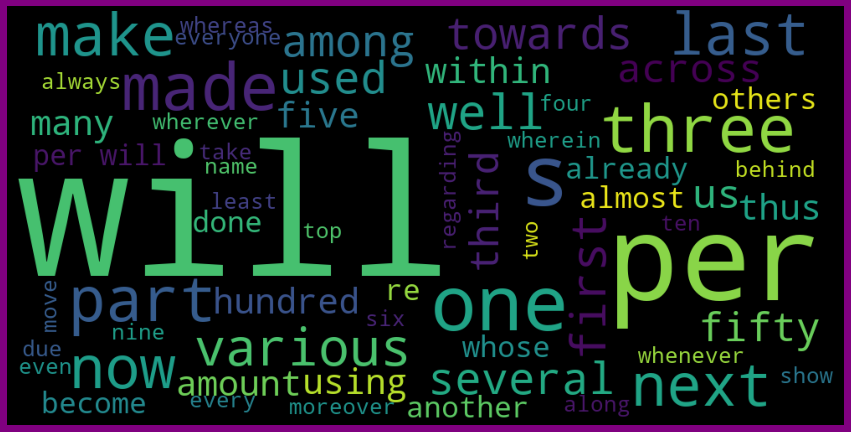

In [12]:
unique_string=(" ").join(stop_list)
unique_string = unique_string.lower()
wordcloud = WordCloud(width = 1000, height = 500, background_color ='black').generate(unique_string)
plt.figure(figsize=(15,8), facecolor = "purple")
plt.imshow(wordcloud)
plt.axis("off")
plt.show()
plt.close()

## Lemmatization

In [14]:
for token in doc:
    print(token.text,'-',token.lemma_)

﻿Budget - ﻿Budget
2023 - 2023
- - -
2024 - 2024

 - 

Introduction - introduction

 - 

1.This - 1.this
Budget - Budget
hopes - hope
to - to
build - build
on - on
the - the
foundation - foundation
laid - lay
in - in
the - the
previous - previous

 - 

Budget - Budget
, - ,
and - and
the - the
blueprint - blueprint
drawn - draw
for - for
India@100 - India@100
. - .
We - we
envision - envision
a - a
prosperous - prosperous

 - 

and - and
inclusive - inclusive
India - India
, - ,
in - in
which - which
the - the
fruits - fruit
of - of
development - development
reach - reach
all - all
regions - region
and - and

 - 

citizens - citizen
, - ,
especially - especially
our - our
youth - youth
, - ,
women - woman
, - ,
farmers - farmer
, - ,
OBCs - obc
, - ,
Scheduled - schedule
Castes - Castes
and - and

 - 

Scheduled - schedule
Tribes - Tribes
. - .

 - 

2.In - 2.in
the - the
75th - 75th
year - year
of - of
our - our
Independence - Independence
, - ,
the - the
world - world
has - have
recog

## POS Tagging

In [15]:
for token in doc:
    print(token.text,'===>',token.pos_,'===>',token.tag_,'====>',token.dep_)

﻿Budget ===> VERB ===> VBG ====> parataxis
2023 ===> NUM ===> CD ====> nummod
- ===> SYM ===> SYM ====> punct
2024 ===> NUM ===> CD ====> prep

 ===> SPACE ===> _SP ====> dep
Introduction ===> NOUN ===> NN ====> nmod

 ===> SPACE ===> _SP ====> dep
1.This ===> PRON ===> DT ====> nummod
Budget ===> PROPN ===> NNP ====> nsubj
hopes ===> VERB ===> VBZ ====> ROOT
to ===> PART ===> TO ====> aux
build ===> VERB ===> VB ====> xcomp
on ===> ADP ===> IN ====> prep
the ===> DET ===> DT ====> det
foundation ===> NOUN ===> NN ====> pobj
laid ===> VERB ===> VBN ====> acl
in ===> ADP ===> IN ====> prep
the ===> DET ===> DT ====> det
previous ===> ADJ ===> JJ ====> amod

 ===> SPACE ===> _SP ====> dep
Budget ===> PROPN ===> NNP ====> pobj
, ===> PUNCT ===> , ====> punct
and ===> CCONJ ===> CC ====> cc
the ===> DET ===> DT ====> det
blueprint ===> NOUN ===> NN ====> conj
drawn ===> VERB ===> VBN ====> acl
for ===> ADP ===> IN ====> prep
India@100 ===> PROPN ===> NNP ====> pobj
. ===> PUNCT ===> . ====

In [16]:
# PoS=NOUN:Finding no.of nouns

noun_count=0
verb_count=0
propn_count=0
adj_count=0
adv_count=0

for token in doc:
        if token.pos_=='NOUN':
            noun_count=noun_count+1
        if token.pos_=='VERB':
            verb_count=verb_count+1
        if token.pos_=='PROPN':
            propn_count=propn_count+1
        if token.pos_=='ADJ':
            adj_count=adj_count+1
        if token.pos_=='ADV':
            adv_count=adv_count+1
print(' The count of tokens with PoS as NOUN:',noun_count)
print(' The count of tokens with PoS as VERB:',verb_count)
print(' The count of tokens with PoS as PROPN:',propn_count)
print(' The count of tokens with PoS as ADJ:',adj_count)
print(' The count of tokens with PoS as ADV:',adv_count)

 The count of tokens with PoS as NOUN: 2217
 The count of tokens with PoS as VERB: 840
 The count of tokens with PoS as PROPN: 998
 The count of tokens with PoS as ADJ: 744
 The count of tokens with PoS as ADV: 157


In [17]:
dict= {'Nouns':noun_count,'Verbs':verb_count,"Propositions":propn_count,"Adjectives":adj_count,'Adverbs':adv_count}
dict={k: v for k, v in sorted(dict.items(), key=lambda item: item[1])}
dict

{'Adverbs': 157,
 'Adjectives': 744,
 'Verbs': 840,
 'Propositions': 998,
 'Nouns': 2217}

## Visualising - POS Tagging

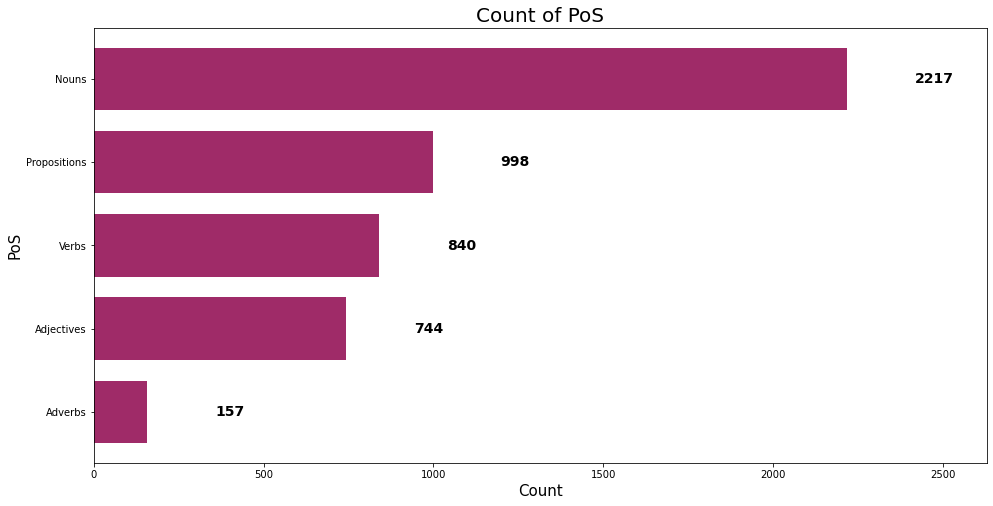

In [18]:
df = pd.DataFrame({'PoS':list(dict.keys()),'Count':list(dict.values())})
y = df['Count']
fig, ax = plt.subplots(figsize=(12,5))
fig.set_size_inches(16,8)
ax.barh(df['PoS'], y, height=0.75, color="#9F2B68")
plt.title('Count of PoS',fontsize="20")
plt.xlabel('Count',fontsize="15")
plt.ylabel('PoS',fontsize="15")
_, xmax = plt.xlim()
plt.xlim(0, xmax+300)
for i, v in enumerate(y):
    ax.text(v +200, i, str(v), color='black', fontweight='bold', fontsize=14, ha='left', va='center')
plt.show()

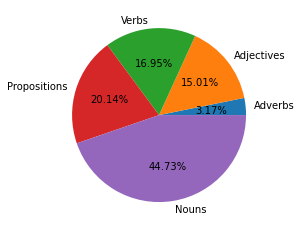

In [19]:
x=list(dict.keys())
y=list(dict.values())
fig = plt.gcf()
#fig.set_size_inches(,8)
plt.pie(y,labels=x,autopct="%1.2f%%");

## NER Tagging

In [20]:
#Number of entities
count=0
for ent in doc.ents:
    print(ent)
    count=count+1
print("No.of entities:",count)

2023-2024
Budget
Budget
India
Scheduled Tribes
the 75th year
Independence
Indian
year
7 per cent
Indian
3.Today
Indians
India
India
4.Our
Sabka Prayas
Jan Bhagidari
India
Aadhaar
Co-Win
UPI
Covid
LiFE
National Hydrogen
Mission
5.During
80
28 months
1st January 2023
Antyodaya
the next one
year
PM
Garib Kalyan
Anna Yojana
2
the Central
Government
6.In
India
2014
2014
1.97
8.In
these nine years
Indian
10th
5th
EPFO
27
7,400
126
UPI
2022
10
11.7
Swachh Bharat Mission
9.6
Ujjawala
220
Covid
102
47.8
PM Jan Dhan
44.6
Suraksha
Bima
Jeevan Jyoti Yojana
2.2
11.4
Kisan Samman Nidhi
Kaal
11
Kaal
Jan Bhagidari
Sabka Saath Sabka
Prayas
12
three
first
4
second
third
13
four
1
Antyodaya Yojana
National Rural Livelihood Mission
81
Self Help Groups
several thousand
2
KAushal Samman
PM VIKAS
centuries
India
Vishwakarma
Atmanirbhar Bharat
first
MSME
5
Scheduled Tribes
3
4
Budget
14
Budget
seven
the ‘Saptarishi
1
Inclusive Development
6
Youth Power
Inclusive Development
6
15
Sabka Saath Sabka Vikas
Castes

In [21]:
#Identifying entities(Place,date,organisation etc)
for ent in doc.ents:
    print(ent,'=>',ent.label_)

2023-2024 => DATE
Budget => ORG
Budget => ORG
India => GPE
Scheduled Tribes => PERSON
the 75th year => DATE
Independence => ORG
Indian => NORP
year => DATE
7 per cent => MONEY
Indian => NORP
3.Today => CARDINAL
Indians => NORP
India => GPE
India => GPE
4.Our => CARDINAL
Sabka Prayas => ORG
Jan Bhagidari => PERSON
India => GPE
Aadhaar => ORG
Co-Win => ORG
UPI => ORG
Covid => PERSON
LiFE => ORG
National Hydrogen
Mission => ORG
5.During => CARDINAL
80 => CARDINAL
28 months => DATE
1st January 2023 => DATE
Antyodaya => ORG
the next one
year => DATE
PM => TIME
Garib Kalyan => ORG
Anna Yojana => PERSON
2 => CARDINAL
the Central
Government => ORG
6.In => CARDINAL
India => GPE
2014 => DATE
2014 => DATE
1.97 => CARDINAL
8.In => CARDINAL
these nine years => DATE
Indian => NORP
10th => ORDINAL
5th => ORDINAL
EPFO => ORG
27 => CARDINAL
7,400 => CARDINAL
126 => CARDINAL
UPI => ORG
2022 => DATE
10 => CARDINAL
11.7 => CARDINAL
Swachh Bharat Mission => PERSON
9.6 => CARDINAL
Ujjawala => GPE
220 => CAR

In [22]:
doc_ent_count=[ent.label_ for ent in doc.ents]
Counter(doc_ent_count)

Counter({'DATE': 80,
         'ORG': 235,
         'GPE': 35,
         'PERSON': 47,
         'NORP': 9,
         'MONEY': 31,
         'CARDINAL': 328,
         'TIME': 3,
         'ORDINAL': 17,
         'PRODUCT': 2,
         'LOC': 2,
         'LANGUAGE': 1,
         'LAW': 7,
         'WORK_OF_ART': 8,
         'EVENT': 1,
         'PERCENT': 2,
         'QUANTITY': 1})

In [23]:
for ent in doc.ents:
    if ent.label_ != 'CARDINAL': # filter out entities with label "CARDINAL"
        print(ent.text, '=>', ent.label_)

2023-2024 => DATE
Budget => ORG
Budget => ORG
India => GPE
Scheduled Tribes => PERSON
the 75th year => DATE
Independence => ORG
Indian => NORP
year => DATE
7 per cent => MONEY
Indian => NORP
Indians => NORP
India => GPE
India => GPE
Sabka Prayas => ORG
Jan Bhagidari => PERSON
India => GPE
Aadhaar => ORG
Co-Win => ORG
UPI => ORG
Covid => PERSON
LiFE => ORG
National Hydrogen
Mission => ORG
28 months => DATE
1st January 2023 => DATE
Antyodaya => ORG
the next one
year => DATE
PM => TIME
Garib Kalyan => ORG
Anna Yojana => PERSON
the Central
Government => ORG
India => GPE
2014 => DATE
2014 => DATE
these nine years => DATE
Indian => NORP
10th => ORDINAL
5th => ORDINAL
EPFO => ORG
UPI => ORG
2022 => DATE
Swachh Bharat Mission => PERSON
Ujjawala => GPE
Covid => PERSON
PM Jan Dhan => DATE
Suraksha
Bima => ORG
Jeevan Jyoti Yojana => PERSON
Kisan Samman Nidhi => PERSON
Kaal => PERSON
Kaal => PERSON
Jan Bhagidari => PERSON
Sabka Saath Sabka
Prayas => PERSON
first => ORDINAL
second => ORDINAL
third 

In [24]:
most_ent=[]
for ent in doc.ents:
    if ent.label_ != 'CARDINAL':
      most_ent.append(ent.text)
print(most_ent)

['2023-2024', 'Budget', 'Budget', 'India', 'Scheduled Tribes', 'the 75th year', 'Independence', 'Indian', 'year', '7 per cent', 'Indian', 'Indians', 'India', 'India', 'Sabka Prayas', 'Jan Bhagidari', 'India', 'Aadhaar', 'Co-Win', 'UPI', 'Covid', 'LiFE', 'National Hydrogen\nMission', '28 months', '1st January 2023', 'Antyodaya', 'the next one\nyear', 'PM', 'Garib Kalyan', 'Anna Yojana', 'the Central\nGovernment', 'India', '2014', '2014', 'these nine years', 'Indian', '10th', '5th', 'EPFO', 'UPI', '2022', 'Swachh Bharat Mission', 'Ujjawala', 'Covid', 'PM Jan Dhan', 'Suraksha\nBima', 'Jeevan Jyoti Yojana', 'Kisan Samman Nidhi', 'Kaal', 'Kaal', 'Jan Bhagidari', 'Sabka Saath Sabka\nPrayas', 'first', 'second', 'third', 'Antyodaya Yojana', 'National Rural Livelihood Mission', 'Self Help Groups', 'KAushal Samman', 'PM VIKAS', 'centuries', 'India', 'Vishwakarma', 'Atmanirbhar Bharat', 'first', 'MSME', 'Scheduled Tribes', 'Budget', 'Budget', 'the ‘Saptarishi', 'Inclusive Development', 'Youth Pow

In [25]:
# Most common

count_dis = Counter(most_ent).most_common()

## Visualising - NER Tagging

In [26]:
x_val = [x[0] for x in count_dis]
y_val = [x[1] for x in count_dis]

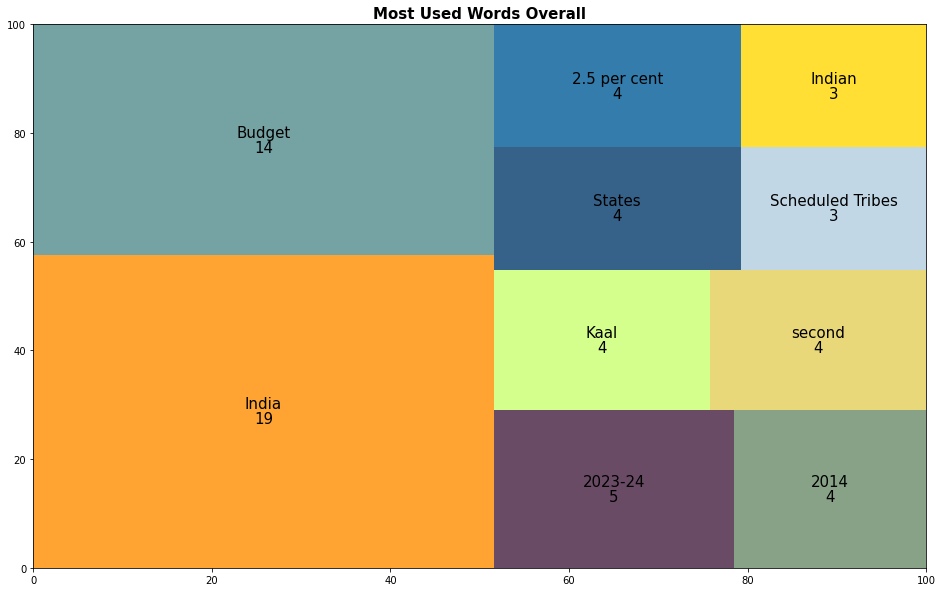

In [27]:
squarify.plot(sizes=y_val[:10], label=x_val[:15],color=['#FF8C00' ,'#528B8B' ,"#451e3e" ,'#698B69','#CAFF70','#E3CF57','#03396c',
'#005b96','#b3cde0','#FFD700'],value=y_val[:15], alpha=.8,text_kwargs={'fontsize':15} )
fig1 = plt.gcf()
ax1 = fig1.add_subplot()
fig1.set_size_inches(16, 10)
plt.title("Most Used Words Overall",fontsize=15,fontweight="bold")
plt.axis('off')
plt.show()

['Budget', 'Budget', 'Independence', 'Sabka Prayas', 'Aadhaar', 'Co-Win', 'UPI', 'LiFE', 'National Hydrogen\nMission', 'Antyodaya', 'Garib Kalyan', 'the Central\nGovernment', 'EPFO', 'UPI', 'Suraksha\nBima', 'National Rural Livelihood Mission', 'PM VIKAS', 'MSME', 'Budget', 'Budget', 'Inclusive Development', 'Youth Power', 'Inclusive Development', 'Sabka Saath Sabka Vikas', 'Jammu &\nKashmir', 'Budget', 'Agriculture and Cooperation\nDigital Public Infrastructure for Agriculture', 'Digital', 'Agriculture Accelerator Fund', 'An Agriculture Accelerator Fund', 'Atmanirbhar Horticulture Clean Plant Program', 'Atmanirbhar Clean Plant Program', 'Global Hub for Millets', 'ragi', 'the Indian Institute', 'Millet Research', 'Hyderabad', 'the Centre of Excellence', 'Agriculture Credit', 'PM Matsya Sampada Yojana', 'micro & small', 'Ministry of Cooperation', 'PACS', 'PACS', 'Health', 'Education', 'Skilling\nMedical & Nursing Colleges', 'Sickle Cell Anaemia Elimination Mission', 'Sickle Cell Anaemia

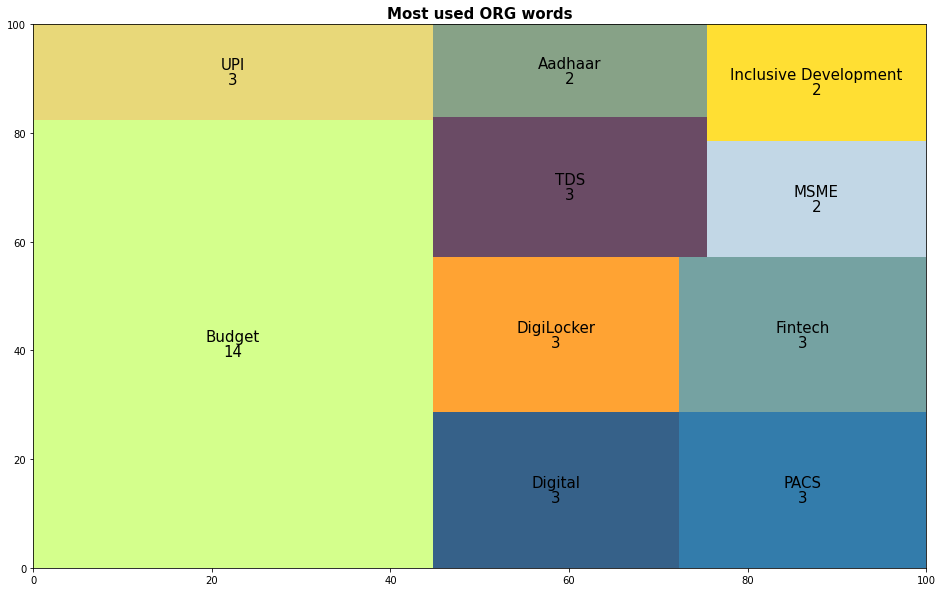

In [28]:
most_ent_org =[]
for ent in doc.ents:
    if ent.label_ == 'ORG':
      most_ent_org.append(ent.text)
print(most_ent_org)

count_dis_org = Counter(most_ent_org).most_common()

x_val = [x[0] for x in count_dis_org]
y_val = [x[1] for x in count_dis_org]

squarify.plot(sizes=y_val[:10], label=x_val[:15],color=['#CAFF70','#E3CF57','#03396c','#005b96','#FF8C00' ,'#528B8B' ,"#451e3e" ,'#698B69','#b3cde0','#FFD700'],value=y_val[:15], alpha=.8,text_kwargs={'fontsize':15} )
fig1 = plt.gcf()
ax1 = fig1.add_subplot()
fig1.set_size_inches(16, 10)
plt.title("Most used ORG words",fontsize=15,fontweight="bold")
plt.axis('off')
plt.show()

In [29]:
Counter(most_ent).most_common(50)

[('India', 19),
 ('Budget', 14),
 ('2023-24', 5),
 ('2014', 4),
 ('Kaal', 4),
 ('second', 4),
 ('States', 4),
 ('2.5 per cent', 4),
 ('Scheduled Tribes', 3),
 ('Indian', 3),
 ('Aadhaar', 3),
 ('UPI', 3),
 ('Covid', 3),
 ('first', 3),
 ('third', 3),
 ('Digital', 3),
 ('PACS', 3),
 ('the next three years', 3),
 ('Centre', 3),
 ('AI', 3),
 ('DigiLocker', 3),
 ('Fintech', 3),
 ('this year', 3),
 ('TDS', 3),
 ('7 per cent', 2),
 ('Jan Bhagidari', 2),
 ('LiFE', 2),
 ('2022', 2),
 ('centuries', 2),
 ('MSME', 2),
 ('Inclusive Development', 2),
 ('Youth Power', 2),
 ('Ladakh', 2),
 ('National Digital Library', 2),
 ('Pradhan Mantri PVTG Development Mission', 2),
 ('Eklavya Model Residential Schools', 2),
 ('Urban Infrastructure Development Fund', 2),
 ('UIDF', 2),
 ('Union Territories', 2),
 ('National Data Governance Policy', 2),
 ('KYC', 2),
 ('Digital India', 2),
 ('PAN', 2),
 ('Vivad', 2),
 ('State', 2),
 ('Lab Grown Diamonds', 2),
 ('LGD', 2),
 ('Green Credit Programme', 2),
 ('GOBARdhan',

## Entity Matcher

In [30]:
matcher_10=Matcher(nlp.vocab)
pattern_10=[{"ENT_TYPE":'PERSON'}]
matcher_10.add('Pattern10',[pattern_10])
match_10=matcher_10(doc)

In [31]:
print(len(match_10))

88


In [32]:
for match_id,start,end in match_10:
    span=doc[start:end]
    print(span.text)

Scheduled
Tribes
Jan
Bhagidari
Covid
Anna
Yojana
Swachh
Bharat
Mission
Covid
Jeevan
Jyoti
Yojana
Kisan
Samman
Nidhi
Kaal
Kaal
Jan
Bhagidari
Sabka
Saath
Sabka


Prayas
Antyodaya
Yojana
Self
Help
Groups
KAushal
Samman
Vishwakarma
Atmanirbhar
Bharat
Scheduled
Tribes
Scheduled
Tribes
vanchiton
ko
variyata
Ladakh
Sahakar
Se
Samriddhi
Vajpayee
Jal
Shakti
Eklavya
Model
Residential
Schools
List
Make
AI
Aadhaar
Covid
Vishwas
II
Video
KYC
Lifestyle
Ladakh
GOBARdhan
Dharohar
Mann
Ki
Baat
Dharohar
Kaal
IFSCA
Mahotsav
Mahila
Samman
Azadi
Ka
Kaal
Primary
Co
-
operative
Mamata
Banerjee
Lok
Sabha
Banerjee


## Phase Matcher

In [ ]:
matcher_2=Matcher(nlp.vocab)
pattern_2=[{'text':'India'},
          {'text':'is'}]
matcher_2.add('Pattern2',[pattern_2])
match_2=matcher_2(doc)

print("Occcurance of this line is:", len(match_2))

for match_id,start,end in match_2:
    span=doc[start:end]
    print(span)

## Visualizing the Entity Recognizer

In [33]:
print(displacy.render(doc, style='ent'))

None


## Visualizing dependency parse & POS tags

In [42]:
from spacy import displacy
displacy.render(doc,style='dep') # Dependence

## Sentiment Analysis 

In [34]:
import nltk
from textblob import TextBlob
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ishik\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\ishik\AppData\Roaming\nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\ishik\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping taggers\averaged_perceptron_tagger.zip.


True

In [35]:
from spacy import displacy
from spacy.matcher import Matcher
from collections import Counter

In [36]:
doc1 = doc.text.lower()
words = nltk.word_tokenize(text)
sents = nltk.sent_tokenize(text)
len(sents)

489

In [37]:
word_emotions = []
cntp =0 
cntneg=0
cntneu=0
for word in sents:
    word_emotions.append(TextBlob(word).sentiment)
    #print(len(word_emotions))
    for emotion in word_emotions:
      polarity = emotion.polarity
    if polarity > 0:
      cntp=cntp+1
    elif polarity < 0:
      cntneg=cntneg+1
    else:
      cntneu=cntneu+1
print(cntneg , cntneu , cntp)

59 280 150


In [38]:
import pandas as pd
  
# initialize list elements
data = [[cntneg, 'Negative'], [cntneu, 'Neutral'], [cntp, 'Positive']]
  
# Create the pandas DataFrame with column name is provided explicitly
df = pd.DataFrame(data, columns=['Count','EmotionName'])
  
# print dataframe.
df

,Count,EmotionName
0,59,Negative
1,280,Neutral
2,150,Positive


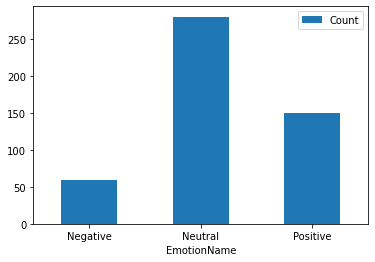

In [39]:
ax = df.plot.bar(x='EmotionName', y='Count', rot=0)

# Thank You